# Question 1

In [ ]:
import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
import matplotlib.pyplot as plt
from collections import Counter
import heapq
from scipy.spatial.distance import squareform
import matplotlib.pyplot as plt
from collections import Counter

# Getting the data and creating the language matrix with 20 features

In [ ]:
base_path = "/content/"

languages = pd.read_csv(base_path + 'languages.csv')
features = pd.read_csv(base_path + 'parameters.csv')
values = pd.read_csv(base_path + 'values.csv')
codes = pd.read_csv(base_path + 'codes.csv')

merged_values = values.merge(
    codes[['ID', 'Parameter_ID', 'Name']],
    left_on=['Code_ID', 'Parameter_ID'],
    right_on=['ID', 'Parameter_ID'],
    how='left',
    validate='many_to_one'
)

matrix = merged_values.pivot_table(
    index='Language_ID',
    columns='Parameter_ID',
    values='Name',
    aggfunc='first'
)

feature_map = features.set_index('ID')['Name'].to_dict()
matrix = matrix.rename(columns=feature_map)

lang_names = (
    languages[['ID', 'Name']]
    .rename(columns={'ID': 'Language_ID'})
)
matrix = (
    matrix
    .reset_index()
    .merge(lang_names, on='Language_ID', how='left')
    .set_index('Name')
)

print("Shape of the resulting matrix (Languages x Features):", matrix.shape)
print("\nFirst 5 rows of the filled matrix:")
matrix.head()

Shape of the resulting matrix (Languages x Features): (2656, 193)

First 5 rows of the filled matrix:


,Language_ID,Alignment of Verbal Person Marking,Expression of Pronominal Subjects,Verbal Person Marking,Third Person Zero of Verbal Person Marking,Order of Person Markers on the Verb,Ditransitive Constructions: The Verb 'Give',Reciprocal Constructions,Passive Constructions,Antipassive Constructions,...,Order of Degree Word and Adjective,Position of Polar Question Particles,Position of Interrogative Phrases in Content Questions,Order of Adverbial Subordinator and Clause,Relationship between the Order of Object and Verb and the Order of Adposition and Noun Phrase,Relationship between the Order of Object and Verb and the Order of Relative Clause and Noun,Relationship between the Order of Object and Verb and the Order of Adjective and Noun,Alignment of Case Marking of Full Noun Phrases,Alignment of Case Marking of Pronouns,The Velar Nasal
Name,,,,,,,,,,,,,,,,,,,,,
Arapesh (Abu),aab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Final,Not initial interrogative phrase,NaN,NaN,NaN,VO and NAdj,NaN,NaN,NaN
Aari,aar,NaN,Subject affixes on verb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,No question particle,NaN,NaN,OV and Postpositions,OV and NRel,OV and NAdj,NaN,NaN,NaN
Abau,aba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,OV and Postpositions,NaN,NaN,NaN,NaN,NaN
Arabic (Chadian),abb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Abidji,abd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Now that we have our Language Matrix it is important to look for NAN value if there is Nan then onyl select only those here in the code below it looks for top 20 feature columns where number of nan values is lowest

In [ ]:
# --- Missing value count for the 'matrix' DataFrame ---
print("--- Missing Value Counts per Feature (before dropping/filling) ---")
missing_counts = matrix.isna().sum()
missing_counts = missing_counts.sort_values(ascending=True)
print(missing_counts.head(20))

--- Missing Value Counts per Feature (before dropping/filling) ---
Language_ID                                                                                         0
Order of Object and Verb                                                                         1139
Order of Subject and Verb                                                                        1161
Order of Subject, Object and Verb                                                                1281
Order of Adjective and Noun                                                                      1290
Order of Negative Morpheme and Verb                                                              1332
Relationship between the Order of Object and Verb and the Order of Adjective and Noun            1341
Order of Genitive and Noun                                                                       1408
Order of Demonstrative and Noun                                                                  1432
Position of Neg

In [ ]:
missing_counts = matrix.isna().sum().sort_values(ascending=True)

# top 20 columns with the fewest missing values
cols_to_keep = missing_counts.index[:20].tolist()

# 3. Subset  matrix to just those columns
matrix_pruned = matrix[cols_to_keep].copy()

# 4. Drop rows where *any* column is NaN
matrix_pruned_complete = matrix_pruned.dropna(how='any')

print("Shape after dropping all rows with missing values:", matrix_pruned_complete.shape)
matrix_pruned_complete.head()

Shape after dropping all rows with missing values: (255, 20)


,Language_ID,Order of Object and Verb,Order of Subject and Verb,"Order of Subject, Object and Verb",Order of Adjective and Noun,Order of Negative Morpheme and Verb,Relationship between the Order of Object and Verb and the Order of Adjective and Noun,Order of Genitive and Noun,Order of Demonstrative and Noun,"Position of Negative Word With Respect to Subject, Object, and Verb",Order of Adposition and Noun Phrase,Negative Morphemes,Order of Numeral and Noun,Relationship between the Order of Object and Verb and the Order of Adposition and Noun Phrase,Position of Tense-Aspect Affixes,Coding of Nominal Plurality,Position of Case Affixes,Prefixing vs. Suffixing in Inflectional Morphology,Polar Questions,Preverbal Negative Morphemes
Name,,,,,,,,,,,,,,,,,,,,
Abkhaz,abk,OV,SV,SOV,Noun-Adjective,Type 3 / Type 4,OV and NAdj,Genitive-Noun,Demonstrative-Noun,MorphNeg,Postpositions,Negative affix,No dominant order,OV and Postpositions,Tense-aspect suffixes,Plural suffix,No case affixes or adpositional clitics,Equal prefixing and suffixing,Interrogative verb morphology,[Neg-V]
Abun,abu,VO,SV,SVO,Noun-Adjective,ObligDoubleNeg,VO and NAdj,Genitive-Noun,Noun-Demonstrative,ObligDoubleNeg,Prepositions,Double negation,Noun-Numeral,VO and Prepositions,No tense-aspect inflection,No plural,No case affixes or adpositional clitics,Little affixation,Question particle,NegV
Arabic (Egyptian),aeg,VO,SV,SVO,Noun-Adjective,OptDoubleNeg,VO and NAdj,Noun-Genitive,Noun-Demonstrative,OptDoubleNeg,Prepositions,Negative particle,No dominant order,VO and Prepositions,Mixed type,Mixed morphological plural,No case affixes or adpositional clitics,Weakly suffixing,Question particle,NegV&[Neg-V]
Agta (Central),agc,VO,VS,VSO,Adjective-Noun,NegV,VO and AdjN,Noun-Genitive,Demonstrative suffix,NegVSO,Prepositions,Negative auxiliary verb,Numeral-Noun,VO and Prepositions,Mixed type,Plural word,No case affixes or adpositional clitics,Strongly suffixing,Question particle,NegV
Ainu,ain,OV,SV,SOV,Adjective-Noun,NegV,OV and AdjN,Genitive-Noun,Demonstrative-Noun,SONegV,Postpositions,Negative particle,Numeral-Noun,OV and Postpositions,Tense-aspect suffixes,Plural suffix,No case affixes or adpositional clitics,Equal prefixing and suffixing,Question particle,NegV


## Data type of each features

In [ ]:
print(matrix_pruned_complete.dtypes)

Language_ID                                                                                      object
Order of Object and Verb                                                                         object
Order of Subject and Verb                                                                        object
Order of Subject, Object and Verb                                                                object
Order of Adjective and Noun                                                                      object
Order of Negative Morpheme and Verb                                                              object
Relationship between the Order of Object and Verb and the Order of Adjective and Noun            object
Order of Genitive and Noun                                                                       object
Order of Demonstrative and Noun                                                                  object
Position of Negative Word With Respect to Subject, Object, and V

# Creating distance matrix by onehot encoding the tables and calculating hamming distance

In [ ]:
import pandas as pd
from scipy.spatial.distance import pdist, squareform
df_ohe = pd.get_dummies(matrix_pruned_complete, prefix_sep='=', dtype=int)
dists = pdist(df_ohe.values, metric='hamming')

# 3) Turn into a square DataFrame for easy lookup
dist_matrix = pd.DataFrame(
    squareform(dists),
    index=df_ohe.index,
    columns=df_ohe.index
)

# 4) Inspect
print("One‑hot shape:", df_ohe.shape)
print("Distance matrix shape:", dist_matrix.shape)
dist_matrix.head()  # show top‑left 5×5 block


One‑hot shape: (255, 363)
Distance matrix shape: (255, 255)


Name,Abkhaz,Abun,Arabic (Egyptian),Agta (Central),Ainu,Akan,Alamblak,Albanian,Amele,Amharic,...,Yagua,Yapese,Yaqui,Yindjibarndi,Yukaghir (Kolyma),Yokuts (Yaudanchi),Yoruba,Yurok,Zapotec (Isthmus),Zapotec (Mitla)
Name,,,,,,,,,,,,,,,,,,,,,
Abkhaz,0.000000,0.088154,0.088154,0.104683,0.049587,0.071625,0.066116,0.082645,0.055096,0.071625,...,0.077135,0.099174,0.060606,0.082645,0.044077,0.093664,0.093664,0.093664,0.093664,0.082645
Abun,0.088154,0.000000,0.055096,0.077135,0.082645,0.055096,0.093664,0.060606,0.066116,0.082645,...,0.077135,0.055096,0.088154,0.077135,0.099174,0.082645,0.038567,0.082645,0.060606,0.071625
Arabic (Egyptian),0.088154,0.055096,0.000000,0.071625,0.088154,0.060606,0.099174,0.055096,0.060606,0.093664,...,0.082645,0.060606,0.093664,0.082645,0.104683,0.082645,0.055096,0.082645,0.055096,0.066116
Agta (Central),0.104683,0.077135,0.071625,0.000000,0.077135,0.093664,0.082645,0.060606,0.088154,0.093664,...,0.071625,0.044077,0.077135,0.077135,0.093664,0.049587,0.066116,0.082645,0.038567,0.066116
Ainu,0.049587,0.082645,0.088154,0.077135,0.000000,0.088154,0.027548,0.060606,0.049587,0.060606,...,0.055096,0.082645,0.022039,0.055096,0.044077,0.060606,0.088154,0.060606,0.071625,0.093664


In [ ]:
block_5x5 = dist_matrix.iloc[:5, :5]
block_5x5

Name,Abkhaz,Abun,Arabic (Egyptian),Agta (Central),Ainu
Name,,,,,
Abkhaz,0.000000,0.088154,0.088154,0.104683,0.049587
Abun,0.088154,0.000000,0.055096,0.077135,0.082645
Arabic (Egyptian),0.088154,0.055096,0.000000,0.071625,0.088154
Agta (Central),0.104683,0.077135,0.071625,0.000000,0.077135
Ainu,0.049587,0.082645,0.088154,0.077135,0.000000


# Defining function to perform hirarchial clustering and plotting the function

In [ ]:
from collections import Counter, defaultdict
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
import matplotlib.pyplot as plt

def plot_and_print_clusters(
    dist_matrix: pd.DataFrame,
    method: str = 'average',
    t: float = 10,
    criterion: str = 'maxclust',
    plot_width: int = 30,
    plot_height: int = 10
):
    # Checks
    assert isinstance(dist_matrix, pd.DataFrame), "dist_matrix must be a DataFrame"
    assert dist_matrix.shape[0] == dist_matrix.shape[1], "Matrix must be square"
    assert (dist_matrix.values.diagonal() == 0).all(), "Diagonal must be zero"

    # 1) Condense
    condensed = squareform(dist_matrix.values)

    # 2) Linkage
    Z = linkage(condensed, method=method)

    # 3) Dendrogram
    plt.figure(figsize=(plot_width, plot_height))
    dendrogram(
        Z,
        labels=dist_matrix.index.tolist(),
        leaf_rotation=90,
        leaf_font_size=8
    )
    plt.title("Hierarchical Clustering Dendrogram")
    plt.ylabel("Distance")
    plt.tight_layout()
    plt.show()

    # 4) Flat clusters
    labels = fcluster(Z, t=t, criterion=criterion)

    # 5) Print cluster counts
    counts = Counter(labels)
    print("Cluster ID : Number of Languages")
    for cid, count in sorted(counts.items()):
        print(f"{cid:>9} : {count}")

    # 6) Print languages in each cluster
    cluster_members = defaultdict(list)
    for label, lang in zip(labels, dist_matrix.index):
        cluster_members[label].append(lang)
    print("\nCluster Memberships:")
    for cid in sorted(cluster_members):
        print(f"Cluster {cid} ({len(cluster_members[cid])} languages):")
        print(", ".join(cluster_members[cid]))
        print("")



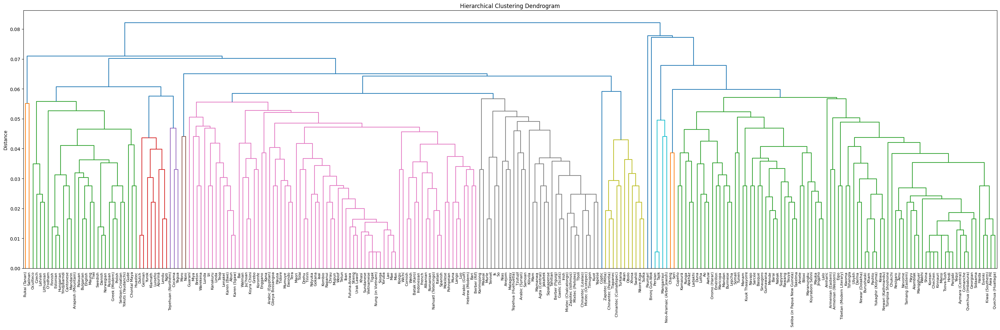

Cluster ID : Number of Languages
        1 : 2
        2 : 28
        3 : 11
        4 : 2
        5 : 108
        6 : 12
        7 : 4
        8 : 86
        9 : 1
       10 : 1

Cluster Memberships:
Cluster 1 (2 languages):
Rukai (Tanan), Salinan

Cluster 2 (28 languages):
Arapesh (Mountain), Bulgarian, Chontal Maya, Cantonese, Czech, Danish, English, Estonian, Finnish, Greek (Modern), Gude, Huastec, Hungarian, Latvian, Lithuanian, Maung, Mandarin, Norwegian, Ocuilteco, O'odham, Palauan, Polish, Russian, Serbian-Croatian, Swedish, Tiwi, Yindjibarndi, Yokuts (Yaudanchi)

Cluster 3 (11 languages):
Apurinã, Cocama, Dutch, German, Klamath, Lendu, Luiseño, Ngiti, Tepehuan (Northern), Yagua, Yurok

Cluster 4 (2 languages):
Moro, Noni

Cluster 5 (108 languages):
Abun, Arabic (Egyptian), Agta (Central), Albanian, Anejom, Arabic (Gulf), Arabic (Syrian), Bai, Bari, Berber (Figuig), Batak (Karo), Breton, Berber (Rif), Chrau, Chinantec (Lealao), Cornish, Drehu, Enggano, Ewondo, French, Futuna-An

In [ ]:
plot_and_print_clusters(dist_matrix)

In [ ]:
def dijkstra_all_pairs(dist_matrix):
    # If it's a DataFrame, extract the language labels and convert to NumPy
    if isinstance(dist_matrix, pd.DataFrame):
        languages = dist_matrix.columns.tolist()
        matrix = dist_matrix.values
    else:
        # If it's a NumPy array, just use indices
        languages = [f"Lang{i}" for i in range(len(dist_matrix))]
        matrix = dist_matrix

    n = len(matrix)
    result = np.zeros((n, n))

    for start in range(n):
        distances = [float('inf')] * n
        distances[start] = 0
        visited = [False] * n
        heap = [(0, start)]

        while heap:
            curr_dist, u = heapq.heappop(heap)
            if visited[u]:
                continue
            visited[u] = True

            for v in range(n):
                if not visited[v] and matrix[u][v] > 0:
                    new_dist = curr_dist + matrix[u][v]
                    if new_dist < distances[v]:
                        distances[v] = new_dist
                        heapq.heappush(heap, (new_dist, v))

        result[start] = distances

    # Return result as a DataFrame with labels
    return pd.DataFrame(result, index=languages, columns=languages)


In [ ]:

shortest_distances = dijkstra_all_pairs(dist_matrix)

print("Updated distance matrix with Dijkstra's shortest paths:")
shortest_distances.head()


Updated distance matrix with Dijkstra's shortest paths:


,Abkhaz,Abun,Arabic (Egyptian),Agta (Central),Ainu,Akan,Alamblak,Albanian,Amele,Amharic,...,Yagua,Yapese,Yaqui,Yindjibarndi,Yukaghir (Kolyma),Yokuts (Yaudanchi),Yoruba,Yurok,Zapotec (Isthmus),Zapotec (Mitla)
Abkhaz,0.000000,0.088154,0.088154,0.104683,0.049587,0.071625,0.066116,0.082645,0.055096,0.071625,...,0.077135,0.099174,0.060606,0.082645,0.044077,0.093664,0.093664,0.093664,0.093664,0.082645
Abun,0.088154,0.000000,0.055096,0.077135,0.082645,0.055096,0.093664,0.060606,0.066116,0.082645,...,0.077135,0.055096,0.088154,0.077135,0.099174,0.082645,0.038567,0.082645,0.060606,0.071625
Arabic (Egyptian),0.088154,0.055096,0.000000,0.071625,0.088154,0.060606,0.099174,0.055096,0.060606,0.093664,...,0.082645,0.060606,0.093664,0.082645,0.104683,0.082645,0.055096,0.082645,0.055096,0.066116
Agta (Central),0.104683,0.077135,0.071625,0.000000,0.077135,0.093664,0.082645,0.060606,0.088154,0.093664,...,0.071625,0.044077,0.077135,0.077135,0.093664,0.049587,0.066116,0.082645,0.038567,0.066116
Ainu,0.049587,0.082645,0.088154,0.077135,0.000000,0.088154,0.027548,0.060606,0.049587,0.060606,...,0.055096,0.082645,0.022039,0.055096,0.044077,0.060606,0.088154,0.060606,0.071625,0.093664


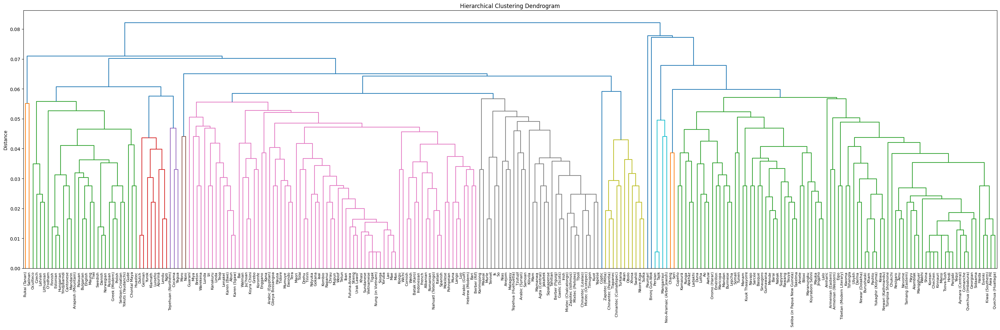

Cluster ID : Number of Languages
        1 : 2
        2 : 28
        3 : 11
        4 : 2
        5 : 108
        6 : 12
        7 : 4
        8 : 86
        9 : 1
       10 : 1

Cluster Memberships:
Cluster 1 (2 languages):
Rukai (Tanan), Salinan

Cluster 2 (28 languages):
Arapesh (Mountain), Bulgarian, Chontal Maya, Cantonese, Czech, Danish, English, Estonian, Finnish, Greek (Modern), Gude, Huastec, Hungarian, Latvian, Lithuanian, Maung, Mandarin, Norwegian, Ocuilteco, O'odham, Palauan, Polish, Russian, Serbian-Croatian, Swedish, Tiwi, Yindjibarndi, Yokuts (Yaudanchi)

Cluster 3 (11 languages):
Apurinã, Cocama, Dutch, German, Klamath, Lendu, Luiseño, Ngiti, Tepehuan (Northern), Yagua, Yurok

Cluster 4 (2 languages):
Moro, Noni

Cluster 5 (108 languages):
Abun, Arabic (Egyptian), Agta (Central), Albanian, Anejom, Arabic (Gulf), Arabic (Syrian), Bai, Bari, Berber (Figuig), Batak (Karo), Breton, Berber (Rif), Chrau, Chinantec (Lealao), Cornish, Drehu, Enggano, Ewondo, French, Futuna-An

In [ ]:

plot_and_print_clusters(shortest_distances, method='average', t=10, criterion='maxclust')

# Question 3 >
 Generate a data set in two dimensions with a division boundary of the form
y = ax2 +x, so points one side of this boundary belong to class A and to the
other, class B. Investigate how well logistic regression works for these data as
a is varied. What about a small neural network? How are these approaches
affected if the number of points is varied, or the balance between class A and
class B in the number of points? How does changing the size of the network
change the performance.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, confusion_matrix
import copy
import pandas as pd
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score

## Function to generate data

In [ ]:
np.random.seed(42)
def generate_data(num_points=10000,
                  frac_pos=0.5,
                  a=0.2,
                  x_range=(-5, 5),
                  y_range=(-20, 20),
                  oversample_factor=2.0,
                  random_seed=42):
    if random_seed is not None:
        np.random.seed(random_seed)

    # Determine how many positives and negatives we need
    n_pos = int(round(num_points * frac_pos))
    n_neg = num_points - n_pos

    # 1) Oversample initial pool
    pool_size = int(np.ceil(num_points * oversample_factor))
    x_pool = np.random.uniform(x_range[0], x_range[1], size=pool_size)
    y_pool = np.random.uniform(y_range[0], y_range[1], size=pool_size)

    # 2) Compute boundary and raw labels
    boundary = a * x_pool**2 + x_pool
    labels_pool = (y_pool > boundary).astype(int)

    # 3) Split indices by class
    idx_pos = np.where(labels_pool == 1)[0]
    idx_neg = np.where(labels_pool == 0)[0]

    # 4) Check availability
    if len(idx_pos) < n_pos or len(idx_neg) < n_neg:
        raise ValueError(
            f"Not enough samples: need {n_pos} positives (got {len(idx_pos)}) "
            f"and {n_neg} negatives (got {len(idx_neg)}). "
            "Increase oversample_factor."
        )

    # 5) Sub‑sample exactly
    chosen_pos = np.random.choice(idx_pos, size=n_pos, replace=False)
    chosen_neg = np.random.choice(idx_neg, size=n_neg, replace=False)
    chosen = np.hstack([chosen_pos, chosen_neg])

    # 6) Build feature and label arrays
    features = np.vstack((x_pool, y_pool)).T[chosen]
    labels   = labels_pool.reshape(-1, 1)[chosen]

    # 7) Shuffle final dataset
    perm = np.random.permutation(num_points)
    return features[perm], labels[perm]



# Creating Neural networs for testing single layer and a multi layer perceptron

### Single layer perceptron

In [ ]:
# --- Single-layer perceptron using nn.Sequential ---
def Single_layer(input_dim=2, output_dim=1):
    model = nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.Sigmoid()
    )
    return model

### Function to create 4 Layer MLP

In [ ]:
def create_3layer_perceptron(input_dim=2, hidden_dim1=16, hidden_dim2=8, hidden_dim3=4, output_dim=1):
    model = nn.Sequential(
        nn.Linear(input_dim, hidden_dim1),   # Hidden Layer 1
        nn.ReLU(),
        nn.Linear(hidden_dim1, hidden_dim2), # Hidden Layer 2
        nn.ReLU(),
        nn.Linear(hidden_dim2, hidden_dim3), # Hidden Layer 3
        nn.ReLU(),
        nn.Linear(hidden_dim3, output_dim),  # Output Layer
        nn.Sigmoid()                         # Activation for binary output
    )
    return model


### Function to create 9 layer MLP

In [ ]:
def create_8layer_perceptron(input_dim=2,
                             hidden_dim1=13,
                             hidden_dim2=10,
                             hidden_dim3=8,
                             hidden_dim4=7,
                             hidden_dim5=6,
                             hidden_dim6=5,
                             hidden_dim7=4,
                             hidden_dim8=3,
                             output_dim=1):
    model = nn.Sequential(
        nn.Linear(input_dim, hidden_dim1),
        nn.ReLU(),
        nn.Linear(hidden_dim1, hidden_dim2),
        nn.ReLU(),
        nn.Linear(hidden_dim2, hidden_dim3),
        nn.ReLU(),
        nn.Linear(hidden_dim3, hidden_dim4),
        nn.ReLU(),
        nn.Linear(hidden_dim4, hidden_dim5),
        nn.ReLU(),
        nn.Linear(hidden_dim5, hidden_dim6),
        nn.ReLU(),
        nn.Linear(hidden_dim6, hidden_dim7),
        nn.ReLU(),
        nn.Linear(hidden_dim7, hidden_dim8),
        nn.ReLU(),
        nn.Linear(hidden_dim8, output_dim),
        nn.Sigmoid()
    )
    return model


### Function to train the models

In [ ]:

# --- Training Function ---
def train_model(model, train_loader, epochs=10, learning_rate=0.001):
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    model.train()
    for epoch in range(epochs):
        for inputs, labels in train_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

## Code for evaluating the Neural Netowkr and plot the graph

In [ ]:
def evaluate_and_plot(
    base_model: nn.Module,
    num_layers: int,
    datasets: list,
    a_values: list,
    epochs: int = 70,
    batch_size: int = 32
):
    """
    Trains and plots decision boundaries for `base_model` over four datasets.
    """
    # FIXED: Changed figsize to be more suitable for A4 paper (portrait orientation)
    fig, axes = plt.subplots(2, 2, figsize=(8,8))
    axes = axes.ravel()

    for i, ((features, labels), a_val) in enumerate(zip(datasets, a_values)):
        ax = axes[i]

        # train / test split
        Xtr, Xte, ytr, yte = train_test_split(
            features, labels, test_size=0.2, random_state=42, shuffle=True
        )
        Xtr_t = torch.FloatTensor(Xtr)
        Xte_t = torch.FloatTensor(Xte)
        ytr_t = torch.FloatTensor(ytr)
        yte_t = torch.FloatTensor(yte)

        # fresh copy of the model
        model = copy.deepcopy(base_model)
        train_loader = DataLoader(
            TensorDataset(Xtr_t, ytr_t),
            batch_size=batch_size, shuffle=True
        )
        train_model(model, train_loader, epochs=epochs)

        # evaluation
        model.eval()
        with torch.no_grad():
            probs = model(Xte_t).numpy().flatten()
        preds = (probs > 0.5).astype(int)
        f1 = f1_score(yte.flatten(), preds)
        cm = confusion_matrix(yte.flatten(), preds)
        accuracy = accuracy_score(yte.flatten(), preds)

        # print metrics
        print(f"\n{'='*20} a = {a_val} {'='*20}")
        print(f"{num_layers}-Layer MLP Accuracy: {accuracy:.4f}")
        print(f"{num_layers}-Layer MLP F1 Score: {f1:.4f}")
        print(f"{num_layers}-Layer MLP Confusion Matrix:\n{cm}")

        # plot data
        ax.scatter(
            features[labels.flatten() == 1, 0],
            features[labels.flatten() == 1, 1],
            color='moccasin', alpha=0.5, label='Class 1'
        )
        ax.scatter(
            features[labels.flatten() == 0, 0],
            features[labels.flatten() == 0, 1],
            color='lightgreen', alpha=0.5, label='Class 0'
        )

        # true boundary
        xs = np.linspace(-5, 5, 400)
        y_true_boundary = a_val * xs**2 + xs
        ax.plot(xs, y_true_boundary, color='red', linewidth=3, label='True Boundary')

        # model decision boundary
        xx, yy = np.meshgrid(xs, np.linspace(-20, 20, 400))
        grid = np.c_[xx.ravel(), yy.ravel()]
        with torch.no_grad():
            zz = model(torch.FloatTensor(grid)).numpy().reshape(xx.shape)
        ax.contour(
            xx, yy, zz, levels=[0.5], colors='purple',
            linestyles=':', linewidths=3
        )
        ax.plot([], [], color='purple', linestyle=':', linewidth=3, label=f'{num_layers}-Layer MLP')

        # metrics box
        txt = f"Accuracy: {accuracy:.3f}\nF1: {f1:.3f}\nCM:\n{cm}"
        ax.text(
            0.03, 0.97, txt, transform=ax.transAxes, fontsize=9, va='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7)
        )

        ax.set_title(f'{num_layers}-Layer MLP Decision Boundary (a={a_val})')
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_xlim(-5, 5)
        ax.set_ylim(-20, 20)
        ax.legend(loc='lower right')
        ax.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout(pad=3.0)
    plt.show()


## Balanced Data Generation For Logistic Regression and neural network with 10000

In [ ]:
# --- 1. Data Generation and Verification ---
a_values = [2.0, 1.0, 0.1, 0.0000001]

print("Generating and verifying balanced datasets using a single random seed...")

# Using a single seed for all datasets to ensure consistency
datasets = []
fixed_seed = 42
for a_val in a_values:
    print(f"\n--- Generating for a = {a_val} (seed={fixed_seed}) ---")
    features, labels = generate_data(num_points = 10000,
        a=a_val,
        frac_pos=0.5,
        random_seed=fixed_seed,
        oversample_factor=4
    )
    datasets.append((features, labels))

    # Verify balance immediately after creation
    class_0_count = np.sum(labels == 0)
    class_1_count = np.sum(labels == 1)
    print(
        f"  Verification: Class 0 = {class_0_count}, Class 1 = {class_1_count}, "
        f"Total = {len(labels)}"
    )


Generating and verifying balanced datasets using a single random seed...

--- Generating for a = 2.0 (seed=42) ---
  Verification: Class 0 = 5000, Class 1 = 5000, Total = 10000

--- Generating for a = 1.0 (seed=42) ---
  Verification: Class 0 = 5000, Class 1 = 5000, Total = 10000

--- Generating for a = 0.1 (seed=42) ---
  Verification: Class 0 = 5000, Class 1 = 5000, Total = 10000

--- Generating for a = 1e-07 (seed=42) ---
  Verification: Class 0 = 5000, Class 1 = 5000, Total = 10000


# Traning and Performance analysis of Differnt machine learning model on balance data with 10000 data point

## Training the logistic regression


*** Evaluating Logistic Regression ***

==================== Training for a = 2.0 ====================
Confusion Matrix:
 [[775 220]
 [139 866]]
F1 Score: 0.8283
Accuracy: 0.8205

==================== Training for a = 1.0 ====================
Confusion Matrix:
 [[826 165]
 [124 885]]
F1 Score: 0.8596
Accuracy: 0.8555

==================== Training for a = 0.1 ====================
Confusion Matrix:
 [[ 960   18]
 [  16 1006]]
F1 Score: 0.9834
Accuracy: 0.9830

==================== Training for a = 1e-07 ====================
Confusion Matrix:
 [[1005    0]
 [   0  995]]
F1 Score: 1.0000
Accuracy: 1.0000


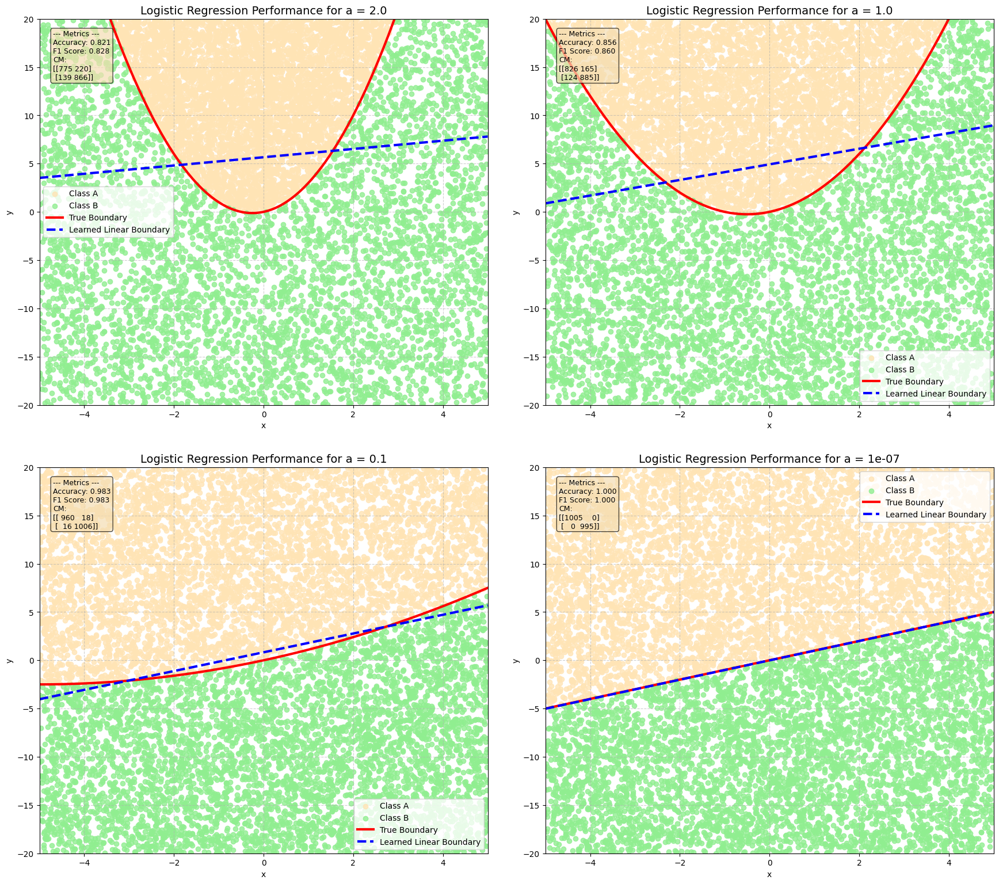

In [ ]:
# --- 2. Logistic Regression Analysis and Plotting ---
print("\n*** Evaluating Logistic Regression ***")
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.ravel()

for i, ((features, labels), a_value) in enumerate(zip(datasets, a_values)):
    ax = axes[i]
    print(f"\n{'='*20} Training for a = {a_value} {'='*20}")

    X_train, X_test, y_train, y_test = train_test_split(
        features, labels, test_size=0.2, random_state=42
    )

    log_reg = LogisticRegression()
    log_reg.fit(X_train, y_train.ravel())

    y_pred = log_reg.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    w = log_reg.coef_[0]
    b = log_reg.intercept_[0]
    coef_x, coef_y = w[0], w[1]

    ax.scatter(features[labels.flatten() == 1, 0], features[labels.flatten() == 1, 1],
               color='moccasin', alpha=0.8, label='Class A')
    ax.scatter(features[labels.flatten() == 0, 0], features[labels.flatten() == 0, 1],
               color='lightgreen', alpha=0.8, label='Class B')

    x_vals = np.linspace(-5, 5, 200)
    y_true_boundary = a_value * x_vals**2 + x_vals
    ax.plot(x_vals, y_true_boundary, color='red', linewidth=3, label='True Boundary')

    y_linear_boundary = -(coef_x * x_vals + b) / coef_y
    ax.plot(x_vals, y_linear_boundary, color='blue', linestyle='--', linewidth=3, label='Learned Linear Boundary')

    metrics_text = (
        f"--- Metrics ---\n"
        f"Accuracy: {accuracy:.3f}\n"
        f"F1 Score: {f1:.3f}\n"
        f"CM:\n{cm}"
    )
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.7)
    ax.text(0.03, 0.97, metrics_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=props)

    ax.set_title(f'Logistic Regression Performance for a = {a_value}', fontsize=14)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-20, 20)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(pad=3.0)
plt.show()


# Study of Performance Of MLP on Same data as Logistic Regression data

## Single layer Perceptron


==================== a = 2.0 ====================
1-Layer MLP Accuracy: 0.8210
1-Layer MLP F1 Score: 0.8290
1-Layer MLP Confusion Matrix:
[[774 221]
 [137 868]]

==================== a = 1.0 ====================
1-Layer MLP Accuracy: 0.8560
1-Layer MLP F1 Score: 0.8605
1-Layer MLP Confusion Matrix:
[[824 167]
 [121 888]]

==================== a = 0.1 ====================
1-Layer MLP Accuracy: 0.9825
1-Layer MLP F1 Score: 0.9829
1-Layer MLP Confusion Matrix:
[[ 959   19]
 [  16 1006]]

==================== a = 1e-07 ====================
1-Layer MLP Accuracy: 1.0000
1-Layer MLP F1 Score: 1.0000
1-Layer MLP Confusion Matrix:
[[1005    0]
 [   0  995]]


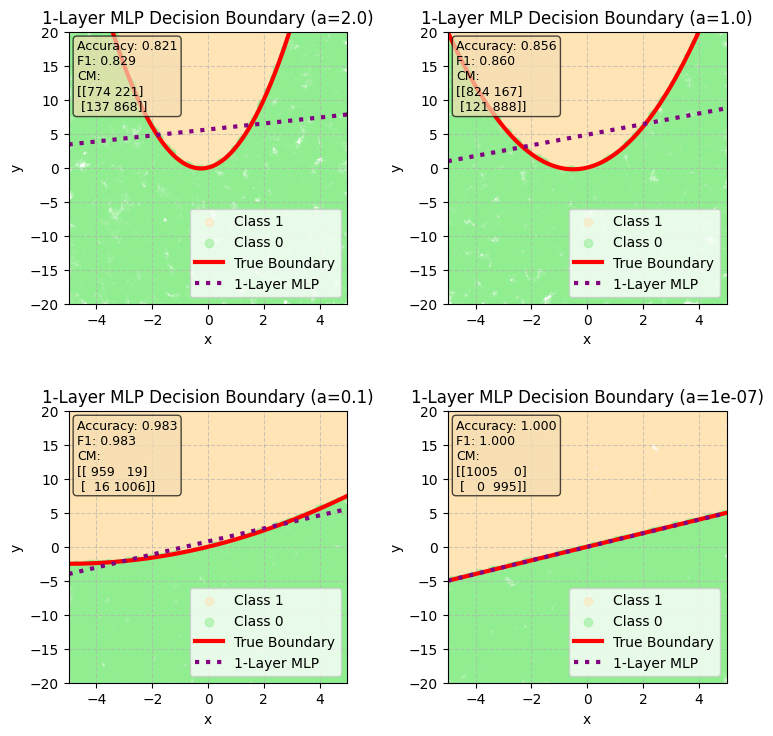

In [ ]:

single_layer_model = Single_layer(input_dim=2, output_dim=1)
evaluate_and_plot(
        base_model=single_layer_model,
        num_layers=1,
        datasets=datasets,
        a_values=a_values,
        epochs=50
    )



## 4-Layer MLP with 24 Neurons per Hidden Layer (Total = 73 Neurons)


==================== a = 2.0 ====================
4-Layer MLP Accuracy: 0.9970
4-Layer MLP F1 Score: 0.9970
4-Layer MLP Confusion Matrix:
[[ 989    6]
 [   0 1005]]

==================== a = 1.0 ====================
4-Layer MLP Accuracy: 0.9980
4-Layer MLP F1 Score: 0.9980
4-Layer MLP Confusion Matrix:
[[ 987    4]
 [   0 1009]]

==================== a = 0.1 ====================
4-Layer MLP Accuracy: 0.9995
4-Layer MLP F1 Score: 0.9995
4-Layer MLP Confusion Matrix:
[[ 977    1]
 [   0 1022]]

==================== a = 1e-07 ====================
4-Layer MLP Accuracy: 0.9995
4-Layer MLP F1 Score: 0.9995
4-Layer MLP Confusion Matrix:
[[1004    1]
 [   0  995]]


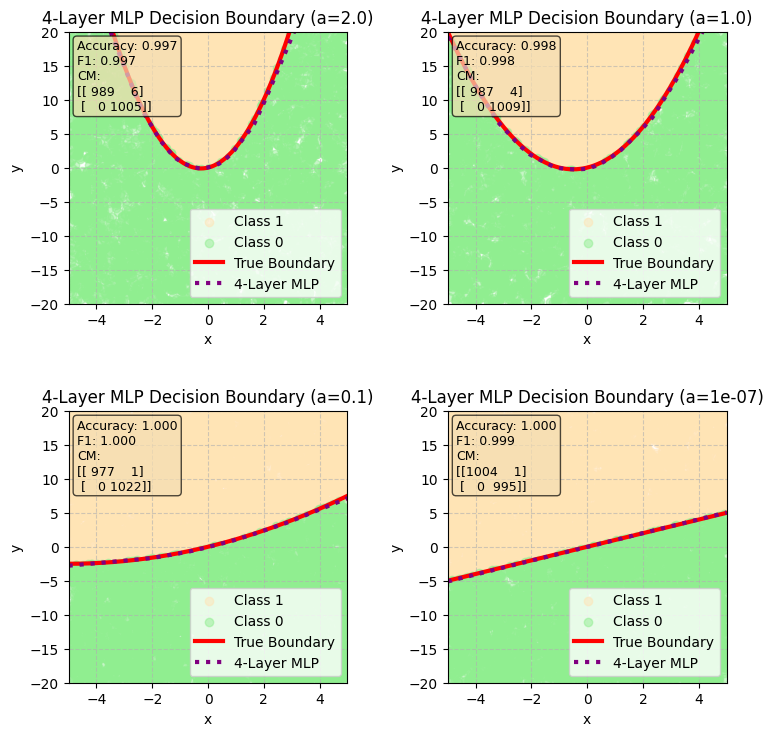

In [ ]:
nn_model = create_3layer_perceptron(
    input_dim=2,
    hidden_dim1=24,
    hidden_dim2=24,
    hidden_dim3=24,   # Added for the third hidden layer
    output_dim=1
)

evaluate_and_plot(
    base_model=nn_model,
    num_layers=4,    # 3 hidden layers
    datasets=datasets,
    a_values=a_values,
    epochs=50,
    batch_size=32
)


## Deep 8-Layer MLP with 9 Neurons per Layer (Total: 73 Neurons)


==================== a = 2.0 ====================
9-Layer MLP Accuracy: 0.9990
9-Layer MLP F1 Score: 0.9990
9-Layer MLP Confusion Matrix:
[[ 994    1]
 [   1 1004]]

==================== a = 1.0 ====================
9-Layer MLP Accuracy: 0.9930
9-Layer MLP F1 Score: 0.9931
9-Layer MLP Confusion Matrix:
[[ 977   14]
 [   0 1009]]

==================== a = 0.1 ====================
9-Layer MLP Accuracy: 0.9990
9-Layer MLP F1 Score: 0.9990
9-Layer MLP Confusion Matrix:
[[ 978    0]
 [   2 1020]]

==================== a = 1e-07 ====================
9-Layer MLP Accuracy: 1.0000
9-Layer MLP F1 Score: 1.0000
9-Layer MLP Confusion Matrix:
[[1005    0]
 [   0  995]]


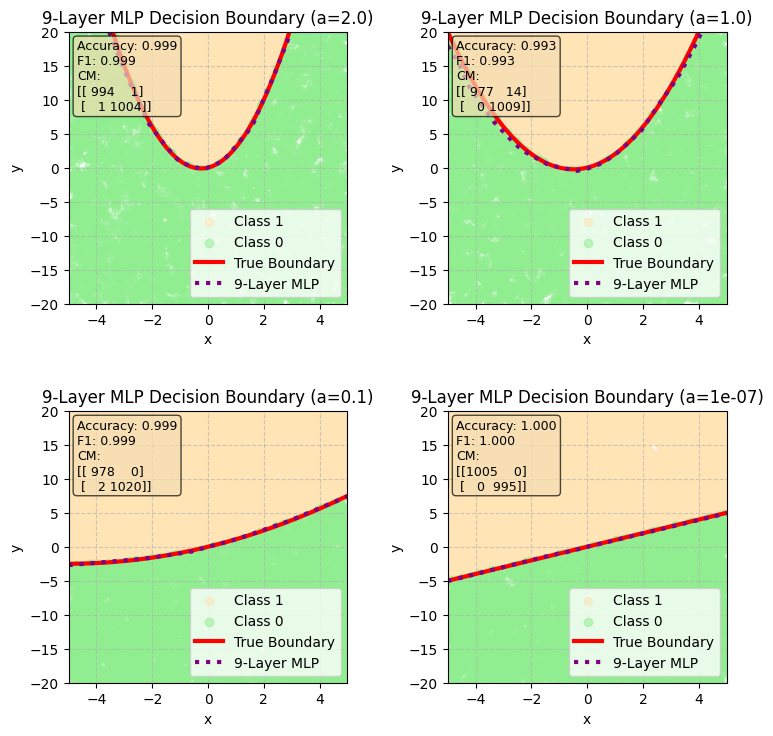

In [ ]:
model_8 = create_8layer_perceptron(
        input_dim=2,
        hidden_dim1=9,
        hidden_dim2=9,
        hidden_dim3=9,
        hidden_dim4=9,
        hidden_dim5=9,
        hidden_dim6=9,
        hidden_dim7=9,
        hidden_dim8=9,
        output_dim=1
    )
evaluate_and_plot(
        base_model=model_8,
        num_layers=9,         # 8 hidden + 1 output (for annotation in titles & legends)
        datasets=datasets,    # (features, labels) arrays
        a_values=a_values,    # true boundary parameter(s)
        epochs=50,
        batch_size=32
    )

# Study of performance model on smaller data

### creating data reducing the size of the data from 10000 to 500

In [ ]:
# --- 1. Data Generation and Verification ---
a_values = [2.0, 1.0, 0.1, 0.0000001]

print("Generating and verifying balanced datasets using a single random seed...")

# Using a single seed for all datasets to ensure consistency
datasets = []
fixed_seed = 42
for a_val in a_values:
    print(f"\n--- Generating for a = {a_val} (seed={fixed_seed}) ---")
    features, labels = generate_data(num_points = 500,
        a=a_val,
        frac_pos=0.5,
        random_seed=fixed_seed,
        oversample_factor=4
    )
    datasets.append((features, labels))

    # Verify balance immediately after creation
    class_0_count = np.sum(labels == 0)
    class_1_count = np.sum(labels == 1)
    print(
        f"  Verification: Class 0 = {class_0_count}, Class 1 = {class_1_count}, "
        f"Total = {len(labels)}"
    )


Generating and verifying balanced datasets using a single random seed...

--- Generating for a = 2.0 (seed=42) ---
  Verification: Class 0 = 250, Class 1 = 250, Total = 500

--- Generating for a = 1.0 (seed=42) ---
  Verification: Class 0 = 250, Class 1 = 250, Total = 500

--- Generating for a = 0.1 (seed=42) ---
  Verification: Class 0 = 250, Class 1 = 250, Total = 500

--- Generating for a = 1e-07 (seed=42) ---
  Verification: Class 0 = 250, Class 1 = 250, Total = 500


# Training and Analysis of Logistic Regression


*** Evaluating Logistic Regression ***

==================== Training for a = 2.0 ====================
Confusion Matrix:
 [[34 13]
 [12 41]]
F1 Score: 0.7664
Accuracy: 0.7500

==================== Training for a = 1.0 ====================
Confusion Matrix:
 [[41  5]
 [ 5 49]]
F1 Score: 0.9074
Accuracy: 0.9000

==================== Training for a = 0.1 ====================
Confusion Matrix:
 [[50  1]
 [ 0 49]]
F1 Score: 0.9899
Accuracy: 0.9900

==================== Training for a = 1e-07 ====================
Confusion Matrix:
 [[48  0]
 [ 1 51]]
F1 Score: 0.9903
Accuracy: 0.9900


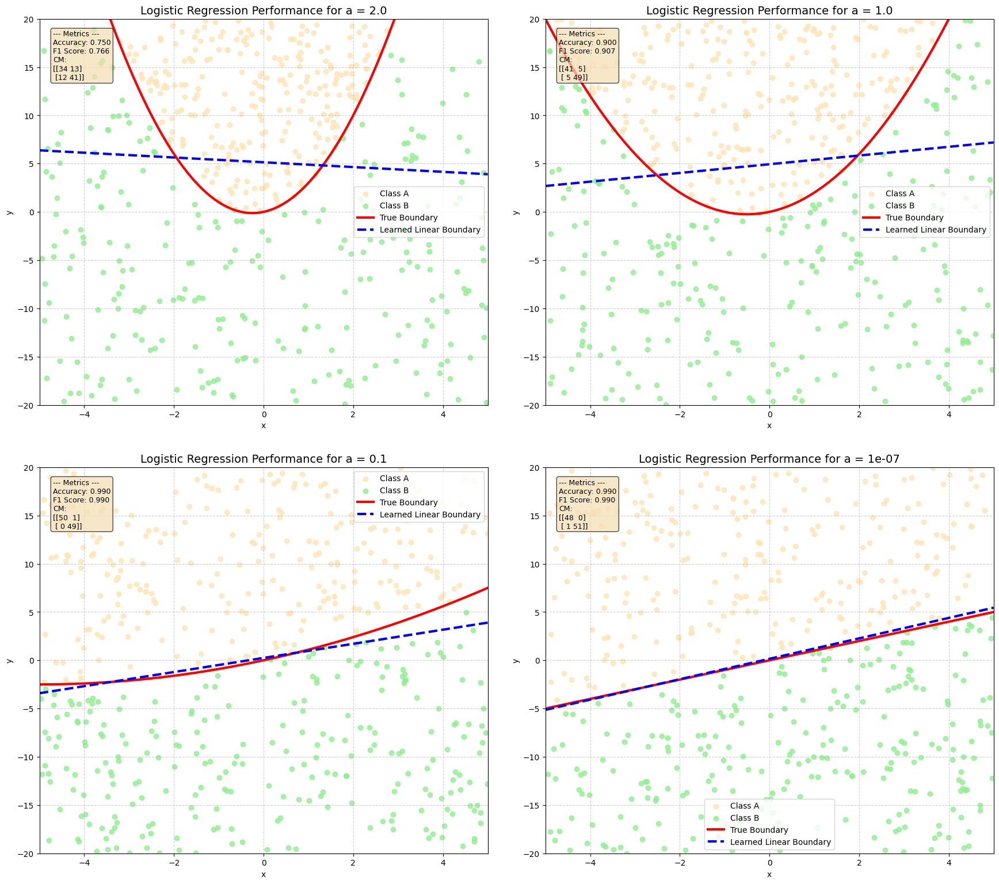

In [ ]:
# --- 2. Logistic Regression Analysis and Plotting ---
print("\n*** Evaluating Logistic Regression ***")
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.ravel()

for i, ((features, labels), a_value) in enumerate(zip(datasets, a_values)):
    ax = axes[i]
    print(f"\n{'='*20} Training for a = {a_value} {'='*20}")

    X_train, X_test, y_train, y_test = train_test_split(
        features, labels, test_size=0.2, random_state=42
    )

    log_reg = LogisticRegression()
    log_reg.fit(X_train, y_train.ravel())

    y_pred = log_reg.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    w = log_reg.coef_[0]
    b = log_reg.intercept_[0]
    coef_x, coef_y = w[0], w[1]

    ax.scatter(features[labels.flatten() == 1, 0], features[labels.flatten() == 1, 1],
               color='moccasin', alpha=0.8, label='Class A')
    ax.scatter(features[labels.flatten() == 0, 0], features[labels.flatten() == 0, 1],
               color='lightgreen', alpha=0.8, label='Class B')

    x_vals = np.linspace(-5, 5, 200)

    # The oversampling method uses the original boundary without a mathematical bias.
    y_true_boundary = a_value * x_vals**2 + x_vals
    ax.plot(x_vals, y_true_boundary, color='red', linewidth=3, label='True Boundary')

    y_linear_boundary = -(coef_x * x_vals + b) / coef_y
    ax.plot(x_vals, y_linear_boundary, color='blue', linestyle='--', linewidth=3, label='Learned Linear Boundary')

    metrics_text = (
        f"--- Metrics ---\n"
        f"Accuracy: {accuracy:.3f}\n"
        f"F1 Score: {f1:.3f}\n"
        f"CM:\n{cm}"
    )
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.7)
    ax.text(0.03, 0.97, metrics_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=props)

    ax.set_title(f'Logistic Regression Performance for a = {a_value}', fontsize=14)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-20, 20)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(pad=3.0)
plt.show()


# Single layer perceptron training and performance analysis


==================== a = 2.0 ====================
1-Layer MLP Accuracy: 0.8300
1-Layer MLP F1 Score: 0.8618
1-Layer MLP Confusion Matrix:
[[30 17]
 [ 0 53]]

==================== a = 1.0 ====================
1-Layer MLP Accuracy: 0.9200
1-Layer MLP F1 Score: 0.9310
1-Layer MLP Confusion Matrix:
[[38  8]
 [ 0 54]]

==================== a = 0.1 ====================
1-Layer MLP Accuracy: 0.9600
1-Layer MLP F1 Score: 0.9608
1-Layer MLP Confusion Matrix:
[[47  4]
 [ 0 49]]

==================== a = 1e-07 ====================
1-Layer MLP Accuracy: 0.9800
1-Layer MLP F1 Score: 0.9811
1-Layer MLP Confusion Matrix:
[[46  2]
 [ 0 52]]


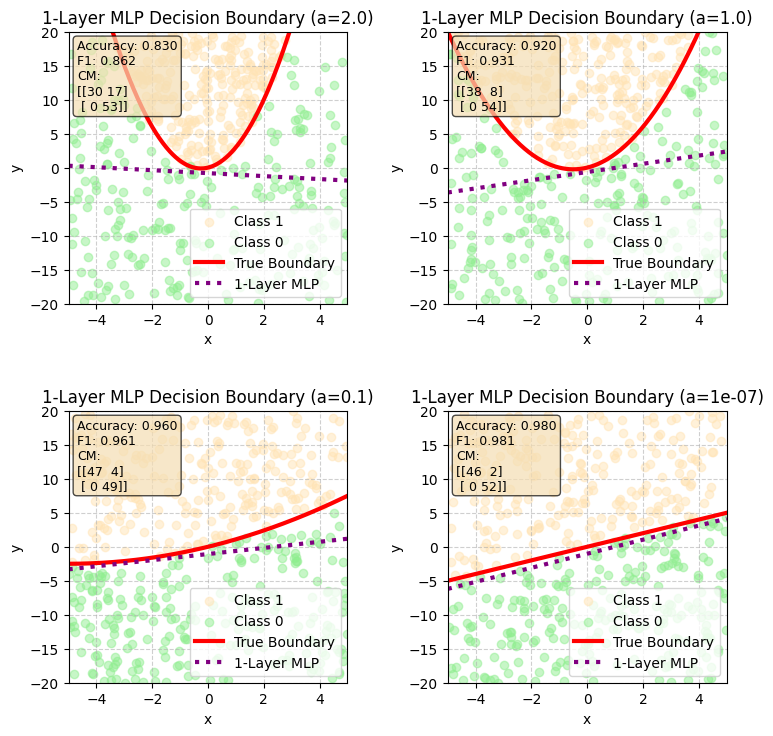

In [ ]:

single_layer_model = Single_layer(input_dim=2, output_dim=1)
evaluate_and_plot(
        base_model=single_layer_model,
        num_layers=1,
        datasets=datasets,
        a_values=a_values,
        epochs=50
    )

## 4-Layer MLP with 24 Neurons per Hidden Layer (Total = 73 Neurons)


==================== a = 2.0 ====================
3-Layer MLP Accuracy: 0.9900
3-Layer MLP F1 Score: 0.9907
3-Layer MLP Confusion Matrix:
[[46  1]
 [ 0 53]]

==================== a = 1.0 ====================
3-Layer MLP Accuracy: 1.0000
3-Layer MLP F1 Score: 1.0000
3-Layer MLP Confusion Matrix:
[[46  0]
 [ 0 54]]

==================== a = 0.1 ====================
3-Layer MLP Accuracy: 1.0000
3-Layer MLP F1 Score: 1.0000
3-Layer MLP Confusion Matrix:
[[51  0]
 [ 0 49]]

==================== a = 1e-07 ====================
3-Layer MLP Accuracy: 0.9900
3-Layer MLP F1 Score: 0.9903
3-Layer MLP Confusion Matrix:
[[48  0]
 [ 1 51]]


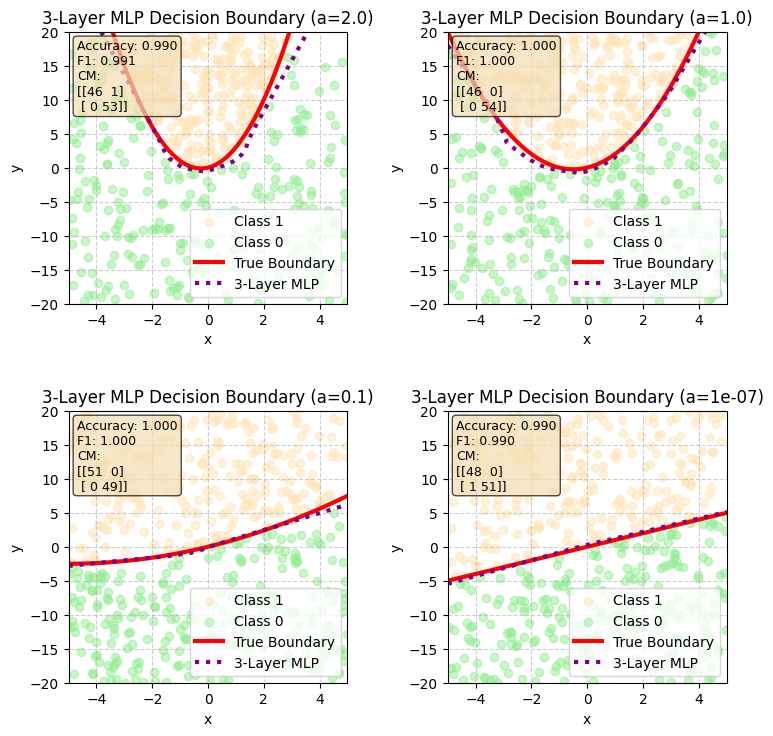

In [ ]:
nn_model = create_3layer_perceptron(
    input_dim=2,
    hidden_dim1=24,
    hidden_dim2=24,
    hidden_dim3=24,   # Added for the third hidden layer
    output_dim=1
)

evaluate_and_plot(
    base_model=nn_model,
    num_layers=3,    # 3 hidden layers
    datasets=datasets,
    a_values=a_values,
    epochs=50,
    batch_size=32
)


## Deep 8-Layer MLP with 9 Neurons per Layer (Total: 73 Neurons)


==================== a = 2.0 ====================
9-Layer MLP Accuracy: 0.9800
9-Layer MLP F1 Score: 0.9815
9-Layer MLP Confusion Matrix:
[[45  2]
 [ 0 53]]

==================== a = 1.0 ====================
9-Layer MLP Accuracy: 0.9800
9-Layer MLP F1 Score: 0.9818
9-Layer MLP Confusion Matrix:
[[44  2]
 [ 0 54]]

==================== a = 0.1 ====================
9-Layer MLP Accuracy: 0.9900
9-Layer MLP F1 Score: 0.9899
9-Layer MLP Confusion Matrix:
[[50  1]
 [ 0 49]]

==================== a = 1e-07 ====================
9-Layer MLP Accuracy: 0.9900
9-Layer MLP F1 Score: 0.9903
9-Layer MLP Confusion Matrix:
[[48  0]
 [ 1 51]]


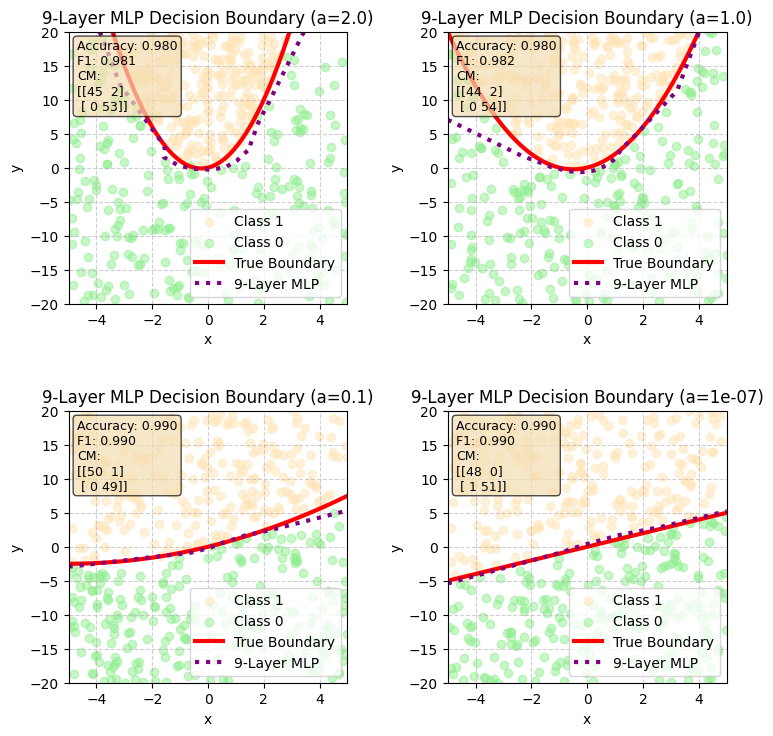

In [ ]:
model_8 = create_8layer_perceptron(
        input_dim=2,
        hidden_dim1=9,
        hidden_dim2=9,
        hidden_dim3=9,
        hidden_dim4=9,
        hidden_dim5=9,
        hidden_dim6=9,
        hidden_dim7=9,
        hidden_dim8=9,
        output_dim=1
    )
evaluate_and_plot(
        base_model=model_8,
        num_layers=9,         # 8 hidden + 1 output (for annotation in titles & legends)
        datasets=datasets,    # (features, labels) arrays
        a_values=a_values,    # true boundary parameter(s)
        epochs=50,            # adjust as needed
        batch_size=32
    )

# Evaluating the Impact of Reduced Data Size on Model Performance With Biased Data with 500 data points

In [ ]:
# --- 1. Data Generation and Verification ---
a_values = [2.0, 1.0, 0.1, 0.0000001]

print("Generating and verifying balanced datasets using a single random seed...")

# Using a single seed for all datasets to ensure consistency
datasets = []
fixed_seed = 42
for a_val in a_values:
    print(f"\n--- Generating for a = {a_val} (seed={fixed_seed}) ---")
    features, labels = generate_data(num_points = 500,
        a=a_val,
        frac_pos=0.1,
        random_seed=fixed_seed,
        oversample_factor=4
    )
    datasets.append((features, labels))

    # Verify balance immediately after creation
    class_0_count = np.sum(labels == 0)
    class_1_count = np.sum(labels == 1)
    print(
        f"  Verification: Class 0 = {class_0_count}, Class 1 = {class_1_count}, "
        f"Total = {len(labels)}"
    )


Generating and verifying balanced datasets using a single random seed...

--- Generating for a = 2.0 (seed=42) ---
  Verification: Class 0 = 450, Class 1 = 50, Total = 500

--- Generating for a = 1.0 (seed=42) ---
  Verification: Class 0 = 450, Class 1 = 50, Total = 500

--- Generating for a = 0.1 (seed=42) ---
  Verification: Class 0 = 450, Class 1 = 50, Total = 500

--- Generating for a = 1e-07 (seed=42) ---
  Verification: Class 0 = 450, Class 1 = 50, Total = 500


# Training and analysis of logistic regression


*** Evaluating Logistic Regression ***

==================== Training for a = 2.0 ====================
Confusion Matrix:
 [[85  1]
 [12  2]]
F1 Score: 0.2353
Accuracy: 0.8700

==================== Training for a = 1.0 ====================
Confusion Matrix:
 [[88  3]
 [ 4  5]]
F1 Score: 0.5882
Accuracy: 0.9300

==================== Training for a = 0.1 ====================
Confusion Matrix:
 [[95  0]
 [ 0  5]]
F1 Score: 1.0000
Accuracy: 1.0000

==================== Training for a = 1e-07 ====================
Confusion Matrix:
 [[87  0]
 [ 2 11]]
F1 Score: 0.9167
Accuracy: 0.9800


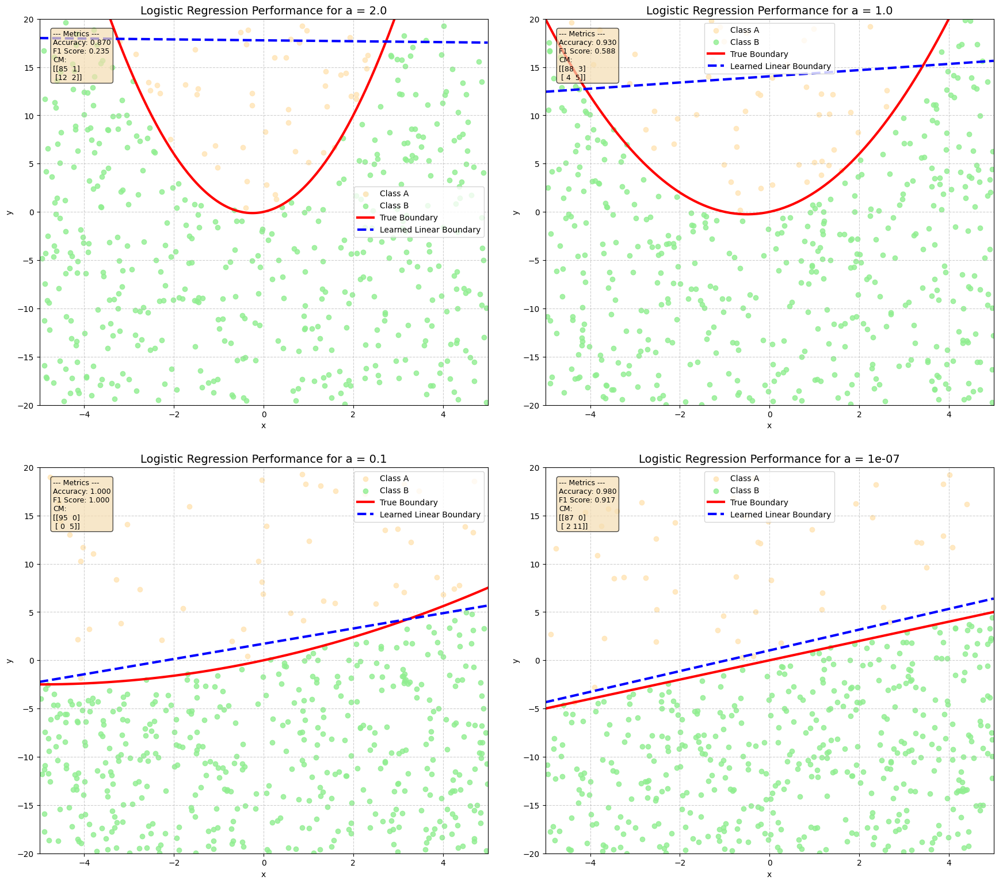

In [ ]:
# --- 2. Logistic Regression Analysis and Plotting ---
print("\n*** Evaluating Logistic Regression ***")
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.ravel()

for i, ((features, labels), a_value) in enumerate(zip(datasets, a_values)):
    ax = axes[i]
    print(f"\n{'='*20} Training for a = {a_value} {'='*20}")

    X_train, X_test, y_train, y_test = train_test_split(
        features, labels, test_size=0.2, random_state=42
    )

    log_reg = LogisticRegression()
    log_reg.fit(X_train, y_train.ravel())

    y_pred = log_reg.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    w = log_reg.coef_[0]
    b = log_reg.intercept_[0]
    coef_x, coef_y = w[0], w[1]

    ax.scatter(features[labels.flatten() == 1, 0], features[labels.flatten() == 1, 1],
               color='moccasin', alpha=0.8, label='Class A')
    ax.scatter(features[labels.flatten() == 0, 0], features[labels.flatten() == 0, 1],
               color='lightgreen', alpha=0.8, label='Class B')

    x_vals = np.linspace(-5, 5, 200)

    # The oversampling method uses the original boundary without a mathematical bias.
    y_true_boundary = a_value * x_vals**2 + x_vals
    ax.plot(x_vals, y_true_boundary, color='red', linewidth=3, label='True Boundary')

    y_linear_boundary = -(coef_x * x_vals + b) / coef_y
    ax.plot(x_vals, y_linear_boundary, color='blue', linestyle='--', linewidth=3, label='Learned Linear Boundary')

    metrics_text = (
        f"--- Metrics ---\n"
        f"Accuracy: {accuracy:.3f}\n"
        f"F1 Score: {f1:.3f}\n"
        f"CM:\n{cm}"
    )
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.7)
    ax.text(0.03, 0.97, metrics_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=props)

    ax.set_title(f'Logistic Regression Performance for a = {a_value}', fontsize=14)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-20, 20)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(pad=3.0)
plt.show()


# Training and analysis of single layer perceptron


==================== a = 2.0 ====================
1-Layer MLP Accuracy: 0.4200
1-Layer MLP F1 Score: 0.0000
1-Layer MLP Confusion Matrix:
[[42 44]
 [14  0]]

==================== a = 1.0 ====================
1-Layer MLP Accuracy: 0.5000
1-Layer MLP F1 Score: 0.0000
1-Layer MLP Confusion Matrix:
[[50 41]
 [ 9  0]]

==================== a = 0.1 ====================
1-Layer MLP Accuracy: 0.3900
1-Layer MLP F1 Score: 0.0000
1-Layer MLP Confusion Matrix:
[[39 56]
 [ 5  0]]

==================== a = 1e-07 ====================
1-Layer MLP Accuracy: 0.4000
1-Layer MLP F1 Score: 0.0323
1-Layer MLP Confusion Matrix:
[[39 48]
 [12  1]]


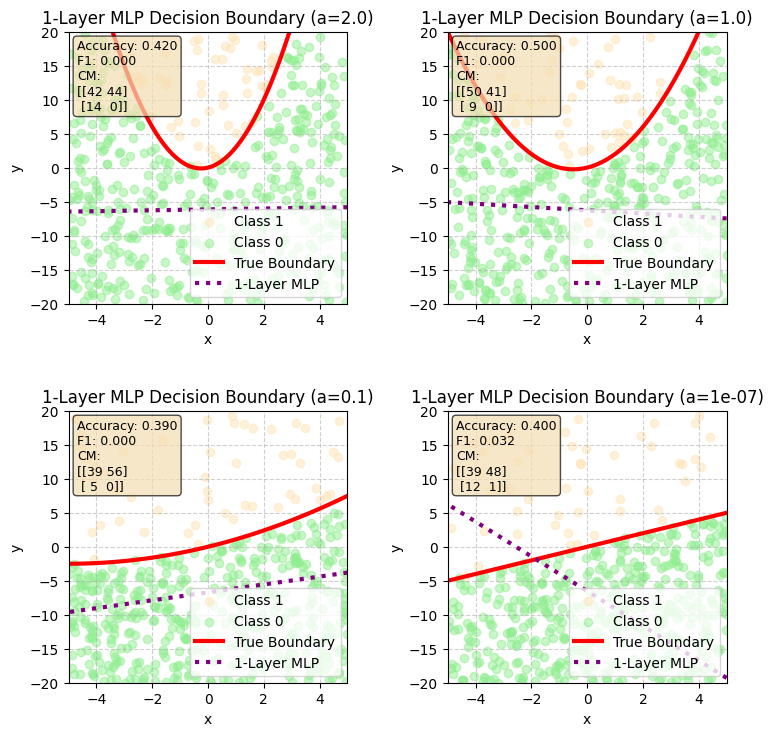

In [ ]:

single_layer_model = Single_layer(input_dim=2, output_dim=1)
evaluate_and_plot(
        base_model=single_layer_model,
        num_layers=1,
        datasets=datasets,
        a_values=a_values,
        epochs=50
    )

# training and prformance analysis 4-Layer MLP with 24 Neurons per Hidden Layer (Total = 73 Neurons)


==================== a = 2.0 ====================
3-Layer MLP Accuracy: 0.9800
3-Layer MLP F1 Score: 0.9231
3-Layer MLP Confusion Matrix:
[[86  0]
 [ 2 12]]

==================== a = 1.0 ====================
3-Layer MLP Accuracy: 0.9900
3-Layer MLP F1 Score: 0.9412
3-Layer MLP Confusion Matrix:
[[91  0]
 [ 1  8]]

==================== a = 0.1 ====================
3-Layer MLP Accuracy: 1.0000
3-Layer MLP F1 Score: 1.0000
3-Layer MLP Confusion Matrix:
[[95  0]
 [ 0  5]]

==================== a = 1e-07 ====================
3-Layer MLP Accuracy: 1.0000
3-Layer MLP F1 Score: 1.0000
3-Layer MLP Confusion Matrix:
[[87  0]
 [ 0 13]]


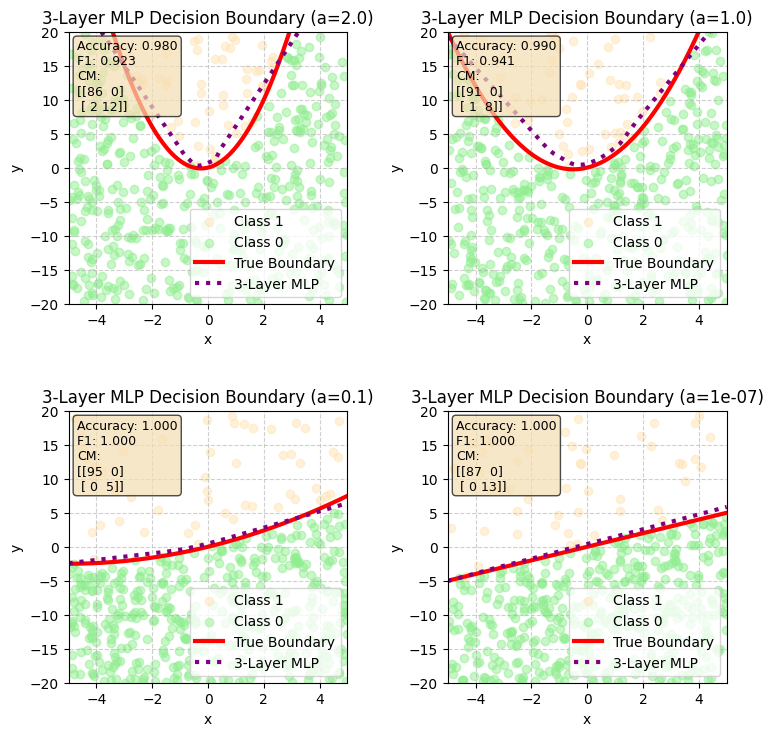

In [ ]:
nn_model = create_3layer_perceptron(
    input_dim=2,
    hidden_dim1=24,
    hidden_dim2=24,
    hidden_dim3=24,   # Added for the third hidden layer
    output_dim=1
)

evaluate_and_plot(
    base_model=nn_model,
    num_layers=3,    # 3 hidden layers
    datasets=datasets,
    a_values=a_values,
    epochs=50,
    batch_size=32
)


# Training and analysis Deep 8-Layer MLP with 9 Neurons per Layer (Total: 73 Neurons)


==================== a = 2.0 ====================
9-Layer MLP Accuracy: 0.9800
9-Layer MLP F1 Score: 0.9545
9-Layer MLP Confusion Matrix:
[[77  2]
 [ 0 21]]

==================== a = 1.0 ====================
9-Layer MLP Accuracy: 1.0000
9-Layer MLP F1 Score: 1.0000
9-Layer MLP Confusion Matrix:
[[80  0]
 [ 0 20]]

==================== a = 0.1 ====================
9-Layer MLP Accuracy: 1.0000
9-Layer MLP F1 Score: 1.0000
9-Layer MLP Confusion Matrix:
[[81  0]
 [ 0 19]]

==================== a = 1e-07 ====================
9-Layer MLP Accuracy: 0.9800
9-Layer MLP F1 Score: 0.9630
9-Layer MLP Confusion Matrix:
[[72  1]
 [ 1 26]]


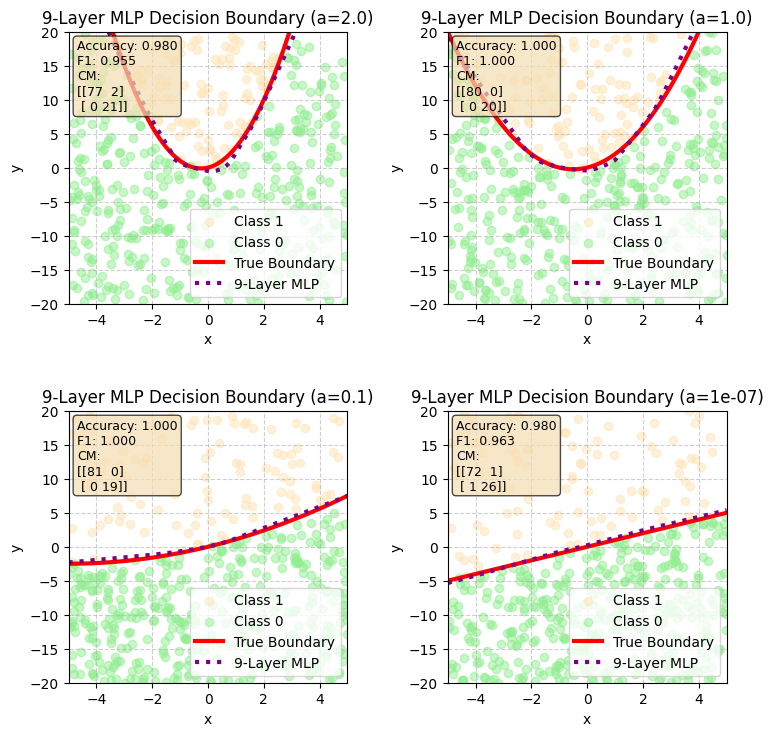

In [ ]:
model_8 = create_8layer_perceptron(
        input_dim=2,
        hidden_dim1=9,
        hidden_dim2=9,
        hidden_dim3=9,
        hidden_dim4=9,
        hidden_dim5=9,
        hidden_dim6=9,
        hidden_dim7=9,
        hidden_dim8=9,
        output_dim=1
    )
evaluate_and_plot(
        base_model=model_8,
        num_layers=9,         # 8 hidden + 1 output (for annotation in titles & legends)
        datasets=datasets,    # (features, labels) arrays
        a_values=a_values,    # true boundary parameter(s)
        epochs=50,            # adjust as needed
        batch_size=32
    )

# Analyzing Model Performance on Biased Data with 10000 data point

### Generating biased data

In [ ]:
# --- 1. Data Generation and Verification ---
a_values = [2.0, 1.0, 0.1, 0.0000001]

print("Generating and verifying balanced datasets using a single random seed...")

# Using a single seed for all datasets to ensure consistency
datasets = []
fixed_seed = 42
for a_val in a_values:
    print(f"\n--- Generating for a = {a_val} (seed={fixed_seed}) ---")
    features, labels = generate_data(num_points = 10000,
        a=a_val,
        frac_pos=0.1,
        random_seed=fixed_seed,
        oversample_factor=4
    )
    datasets.append((features, labels))

    # Verify balance immediately after creation
    class_0_count = np.sum(labels == 0)
    class_1_count = np.sum(labels == 1)
    print(
        f"  Verification: Class 0 = {class_0_count}, Class 1 = {class_1_count}, "
        f"Total = {len(labels)}"
    )


Generating and verifying balanced datasets using a single random seed...

--- Generating for a = 2.0 (seed=42) ---
  Verification: Class 0 = 9000, Class 1 = 1000, Total = 10000

--- Generating for a = 1.0 (seed=42) ---
  Verification: Class 0 = 9000, Class 1 = 1000, Total = 10000

--- Generating for a = 0.1 (seed=42) ---
  Verification: Class 0 = 9000, Class 1 = 1000, Total = 10000

--- Generating for a = 1e-07 (seed=42) ---
  Verification: Class 0 = 9000, Class 1 = 1000, Total = 10000


# Training and Performance analysis of Logistic Regression


*** Evaluating Logistic Regression ***

==================== Training for a = 2.0 ====================
Confusion Matrix:
 [[1767   28]
 [ 186   19]]
F1 Score: 0.1508
Accuracy: 0.8930

==================== Training for a = 1.0 ====================
Confusion Matrix:
 [[1749   47]
 [ 124   80]]
F1 Score: 0.4834
Accuracy: 0.9145

==================== Training for a = 0.1 ====================
Confusion Matrix:
 [[1783    2]
 [   8  207]]
F1 Score: 0.9764
Accuracy: 0.9950

==================== Training for a = 1e-07 ====================
Confusion Matrix:
 [[1812    0]
 [   2  186]]
F1 Score: 0.9947
Accuracy: 0.9990


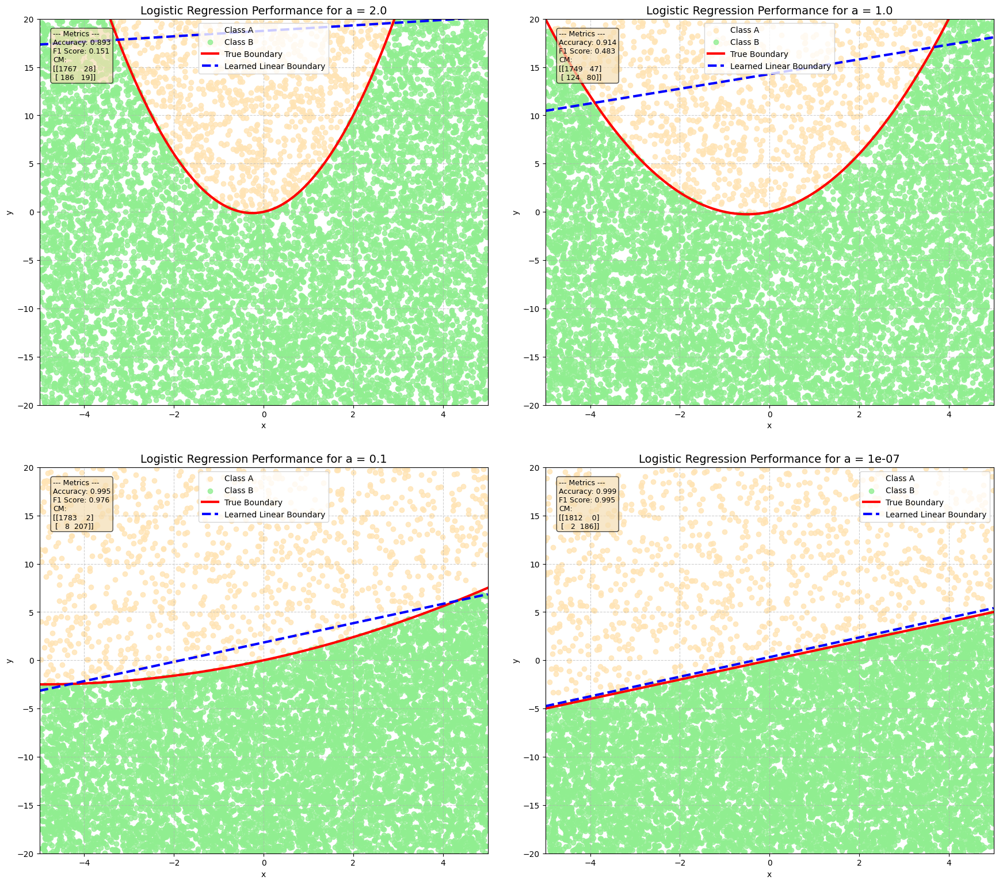

In [ ]:
# --- 2. Logistic Regression Analysis and Plotting ---
print("\n*** Evaluating Logistic Regression ***")
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
axes = axes.ravel()

for i, ((features, labels), a_value) in enumerate(zip(datasets, a_values)):
    ax = axes[i]
    print(f"\n{'='*20} Training for a = {a_value} {'='*20}")

    X_train, X_test, y_train, y_test = train_test_split(
        features, labels, test_size=0.2, random_state=42
    )

    log_reg = LogisticRegression()
    log_reg.fit(X_train, y_train.ravel())

    y_pred = log_reg.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    print("Confusion Matrix:\n", cm)
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    w = log_reg.coef_[0]
    b = log_reg.intercept_[0]
    coef_x, coef_y = w[0], w[1]

    ax.scatter(features[labels.flatten() == 1, 0], features[labels.flatten() == 1, 1],
               color='moccasin', alpha=0.8, label='Class A')
    ax.scatter(features[labels.flatten() == 0, 0], features[labels.flatten() == 0, 1],
               color='lightgreen', alpha=0.8, label='Class B')

    x_vals = np.linspace(-5, 5, 200)

    # The oversampling method uses the original boundary without a mathematical bias.
    y_true_boundary = a_value * x_vals**2 + x_vals
    ax.plot(x_vals, y_true_boundary, color='red', linewidth=3, label='True Boundary')

    y_linear_boundary = -(coef_x * x_vals + b) / coef_y
    ax.plot(x_vals, y_linear_boundary, color='blue', linestyle='--', linewidth=3, label='Learned Linear Boundary')

    metrics_text = (
        f"--- Metrics ---\n"
        f"Accuracy: {accuracy:.3f}\n"
        f"F1 Score: {f1:.3f}\n"
        f"CM:\n{cm}"
    )
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.7)
    ax.text(0.03, 0.97, metrics_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=props)

    ax.set_title(f'Logistic Regression Performance for a = {a_value}', fontsize=14)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-20, 20)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(pad=3.0)
plt.show()


# Training and performance analysis of single layer perceptron


==================== a = 2.0 ====================
1-Layer MLP Accuracy: 0.8920
1-Layer MLP F1 Score: 0.1692
1-Layer MLP Confusion Matrix:
[[1762   33]
 [ 183   22]]

==================== a = 1.0 ====================
1-Layer MLP Accuracy: 0.9155
1-Layer MLP F1 Score: 0.4955
1-Layer MLP Confusion Matrix:
[[1748   48]
 [ 121   83]]

==================== a = 0.1 ====================
1-Layer MLP Accuracy: 0.9945
1-Layer MLP F1 Score: 0.9739
1-Layer MLP Confusion Matrix:
[[1784    1]
 [  10  205]]

==================== a = 1e-07 ====================
1-Layer MLP Accuracy: 0.9965
1-Layer MLP F1 Score: 0.9810
1-Layer MLP Confusion Matrix:
[[1812    0]
 [   7  181]]


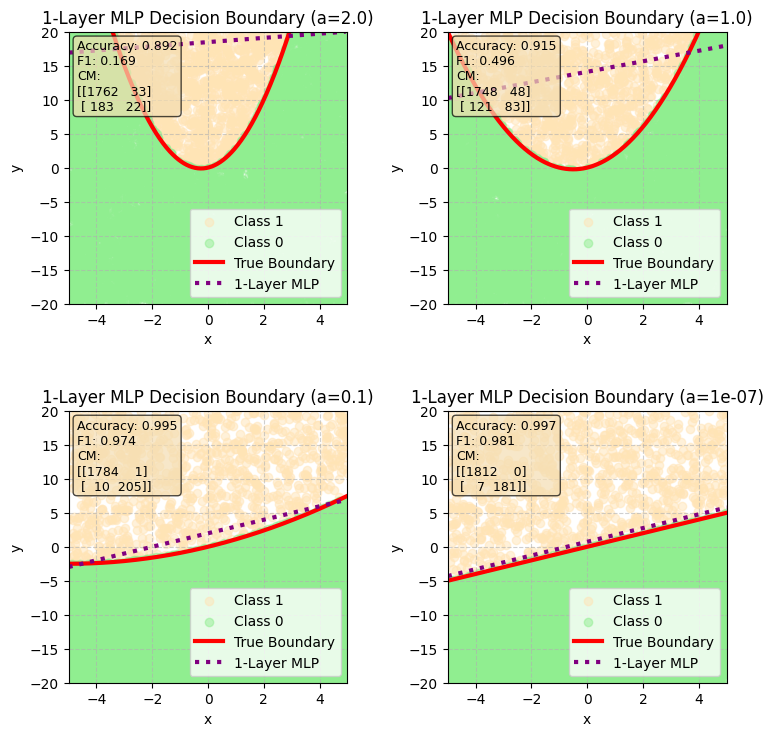

In [ ]:

single_layer_model = Single_layer(input_dim=2, output_dim=1)
evaluate_and_plot(
        base_model=single_layer_model,
        num_layers=1,
        datasets=datasets,
        a_values=a_values,
        epochs=50
    )

# Training and performacne analysis 4-Layer MLP with 24 Neurons per Hidden Layer (Total = 73 Neurons)


==================== a = 2.0 ====================
3-Layer MLP Accuracy: 0.9980
3-Layer MLP F1 Score: 0.9902
3-Layer MLP Confusion Matrix:
[[1793    2]
 [   2  203]]

==================== a = 1.0 ====================
3-Layer MLP Accuracy: 0.9930
3-Layer MLP F1 Score: 0.9645
3-Layer MLP Confusion Matrix:
[[1796    0]
 [  14  190]]

==================== a = 0.1 ====================
3-Layer MLP Accuracy: 0.9995
3-Layer MLP F1 Score: 0.9977
3-Layer MLP Confusion Matrix:
[[1785    0]
 [   1  214]]

==================== a = 1e-07 ====================
3-Layer MLP Accuracy: 0.9995
3-Layer MLP F1 Score: 0.9973
3-Layer MLP Confusion Matrix:
[[1811    1]
 [   0  188]]


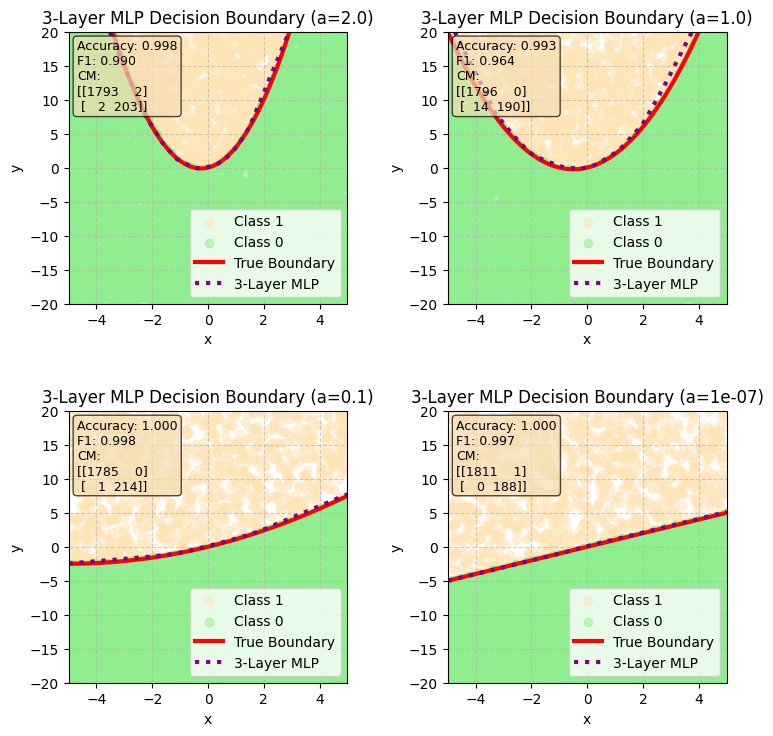

In [ ]:
nn_model = create_3layer_perceptron(
    input_dim=2,
    hidden_dim1=24,
    hidden_dim2=24,
    hidden_dim3=24,   # Added for the third hidden layer
    output_dim=1
)

evaluate_and_plot(
    base_model=nn_model,
    num_layers=3,    # 3 hidden layers
    datasets=datasets,
    a_values=a_values,
    epochs=50,
    batch_size=32
)



==================== a = 2.0 ====================
9-Layer MLP Accuracy: 0.9955
9-Layer MLP F1 Score: 0.9780
9-Layer MLP Confusion Matrix:
[[1791    4]
 [   5  200]]

==================== a = 1.0 ====================
9-Layer MLP Accuracy: 0.9990
9-Layer MLP F1 Score: 0.9951
9-Layer MLP Confusion Matrix:
[[1796    0]
 [   2  202]]

==================== a = 0.1 ====================
9-Layer MLP Accuracy: 0.9995
9-Layer MLP F1 Score: 0.9977
9-Layer MLP Confusion Matrix:
[[1785    0]
 [   1  214]]

==================== a = 1e-07 ====================
9-Layer MLP Accuracy: 1.0000
9-Layer MLP F1 Score: 1.0000
9-Layer MLP Confusion Matrix:
[[1812    0]
 [   0  188]]


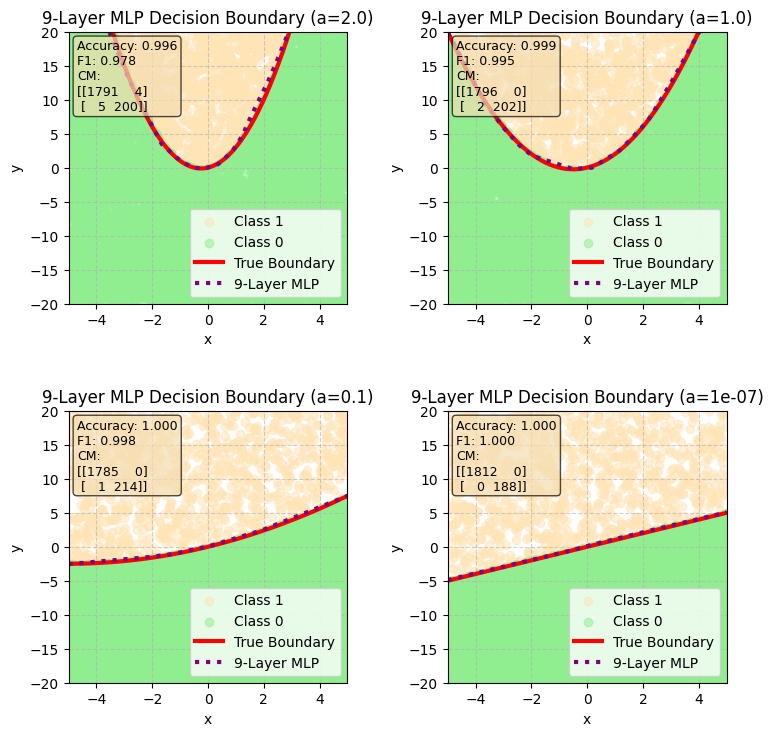

In [ ]:
model_8 = create_8layer_perceptron(
        input_dim=2,
        hidden_dim1=9,
        hidden_dim2=9,
        hidden_dim3=9,
        hidden_dim4=9,
        hidden_dim5=9,
        hidden_dim6=9,
        hidden_dim7=9,
        hidden_dim8=9,
        output_dim=1
    )
evaluate_and_plot(
        base_model=model_8,
        num_layers=9,         # 8 hidden + 1 output (for annotation in titles & legends)
        datasets=datasets,    # (features, labels) arrays
        a_values=a_values,    # true boundary parameter(s)
        epochs=50,            # adjust as needed
        batch_size=32
    )